In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/vqamodel/vqa_model.pth
/kaggle/input/vqa_sample/pytorch/vqamodel/1/vqa_model.pth


In [3]:
from datasets import load_from_disk

In [4]:
dataset = load_from_disk("/kaggle/input/vqa-dataset/vqa_dataset")

Loading dataset from disk:   0%|          | 0/34 [00:00<?, ?it/s]

In [8]:
import torch
import torch.nn as nn
from transformers import ViTImageProcessor,ViTModel, BertModel, BertTokenizer
import numpy as np
from PIL import Image
import torchvision.transforms as transforms
import matplotlib.pyplot as plt

# Load pretrained models and tokenizers
model_name = 'google/vit-base-patch16-224-in21k'
vit_model = ViTModel.from_pretrained(model_name)  # Consider using ViTForQuestionAnswering if available

# Use ViTImageProcessor instead of the deprecated ViTFeatureExtractor
feature_extractor = ViTImageProcessor.from_pretrained(model_name)
text_model = BertModel.from_pretrained('bert-base-uncased')
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')

2024-05-18 11:18:05.962072: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-05-18 11:18:05.962215: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-05-18 11:18:06.130488: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


config.json:   0%|          | 0.00/502 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/160 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

In [33]:
import torch
import torch.nn as nn
from torch.utils.data import DataLoader,Dataset, random_split
from tqdm import tqdm
from transformers import BertModel, ViTModel, BertTokenizer

# Load the tokenizer
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')

# Define image transformations
image_transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize image to 224x224 pixels
    transforms.ToTensor(),          # Convert image to PyTorch tensor (0-1 range)
#     transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalize image
])

# Define the VQADataset class
class VQADataset(Dataset):
    def __init__(self, dataset, vit_model, bert_tokenizer, image_transform, vit_feature_extractor):
        self.dataset = dataset
        self.vit_model = vit_model
        self.bert_tokenizer = bert_tokenizer
        self.image_transform = image_transform
        self.vit_feature_extractor = vit_feature_extractor

    def __len__(self):
        return len(self.dataset)

    def __getitem__(self, idx):
        item = self.dataset[idx]
        image_path = item["image"]
        question = item["question"]
        label = item["multiple_choice_answer"]

        # Preprocess image
        if image_path.mode != "RGB":
            image = image_path.convert("RGB")
        else:
            image = image_path

        # Preprocess image
        image = self.image_transform(image)
        original_image = image

        # Tokenize inputs
        inputs = self.bert_tokenizer(question, return_tensors="pt", padding=True, truncation=True, max_length=64)
        input_ids = inputs["input_ids"].squeeze(0)
        attention_mask = inputs["attention_mask"].squeeze(0)

        # Extract image features using ViT
        with torch.no_grad():
            inputs = self.vit_feature_extractor(images=image, return_tensors="pt",do_rescale=False)
            pixel_values = inputs.pixel_values  # Move to GPU
            image_features = self.vit_model(pixel_values=pixel_values, return_dict=True).last_hidden_state[:, 0, :].squeeze(0)

        return {
            "image_features": image_features,
            "input_ids": input_ids,
            "attention_mask": attention_mask,
            "label": label,
            "original_image":original_image
        }


# Assuming dataset and VQADataset are already defined
test_dataset = dataset.select(range(10001,10050))

# Split the dataset into training, validation, and test s
test_vqa_dataset = VQADataset(test_dataset, vit_model, tokenizer, image_transform, feature_extractor)

# Custom collate function
def custom_collate_fn(batch):
    # Find maximum sequence length in the batch
    max_seq_length = max(len(item["input_ids"]) for item in batch)
    
    padded_input_ids = []
    padded_attention_masks = []
    images = []
    labels = []
    original_images = []
    
    for item in batch:
        # Pad input_ids and attention_mask
        input_ids = torch.tensor(item["input_ids"])
        attention_mask = torch.tensor(item["attention_mask"])
        padded_input_ids.append(input_ids)
        padded_attention_masks.append(attention_mask)
        
        # Add image features
        images.append(item["image_features"])
        
         # Encode labels
        label = item["label"]
        encoded_label = torch.tensor(tokenizer.convert_tokens_to_ids(label))
        labels.append(encoded_label)
        original_images.append(item["original_image"])
        
    
    
    # Pad input_ids and attention_mask
    padded_input_ids = pad_sequence(padded_input_ids, batch_first=True, padding_value=0)
    padded_attention_masks = pad_sequence(padded_attention_masks, batch_first=True, padding_value=0)
    
    # Stack all tensors
    images = torch.stack(images, dim=0)
    
    # Convert labels to tensor
    labels = torch.tensor(labels)  # Assuming labels are numerical
    
    # Check sizes
    assert images.size(0) == len(batch), f"Images tensor size mismatch: Got {images.size(0)}, expected {len(batch)}"
    assert labels.size(0) == len(batch), f"Labels tensor size mismatch: Got {labels.size(0)}, expected {len(batch)}"
    
    return {
        "input_ids": padded_input_ids,
        "attention_mask": padded_attention_masks,
        "image_features": images,
        "label": labels,
        "original_image":original_images
    }


# Create DataLoader instances with custom collate functio
test_loader = DataLoader(test_vqa_dataset, batch_size=1, shuffle=False, collate_fn=custom_collate_fn)


/tmp/ipykernel_33/2376171824.py:84: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  input_ids = torch.tensor(item["input_ids"])
/tmp/ipykernel_33/2376171824.py:85: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  attention_mask = torch.tensor(item["attention_mask"])


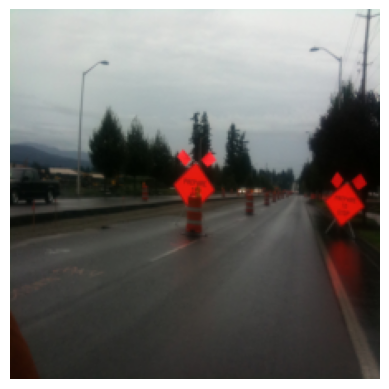

Question: [CLS] prepare to what? [SEP]
Prediction: no
Ground Truth Label: stop


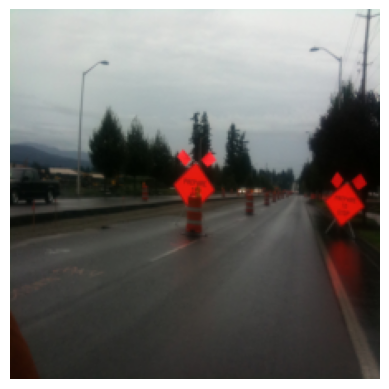

Question: [CLS] are there palm trees? [SEP]
Prediction: no
Ground Truth Label: no


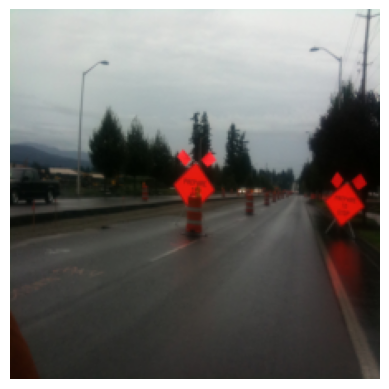

Question: [CLS] what color is the street sign? [SEP]
Prediction: no
Ground Truth Label: orange


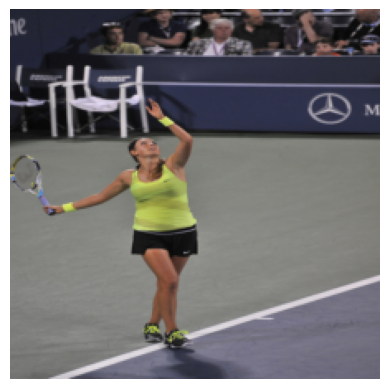

Question: [CLS] what is on the player's knees? [SEP]
Prediction: yes
Ground Truth Label: nothing


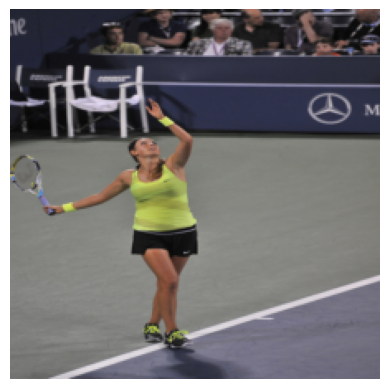

Question: [CLS] what company is sponsoring this game? [SEP]
Prediction: yes
Ground Truth Label: mercedes


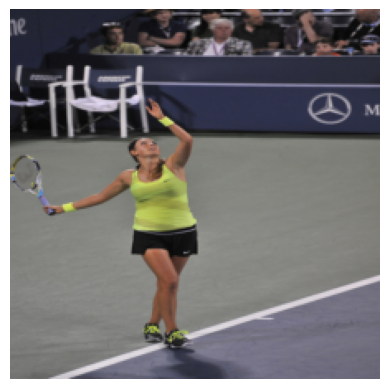

Question: [CLS] what is the correct tennis term for stepping over the boundary line? [SEP]
Prediction: yes
Ground Truth Label: foul


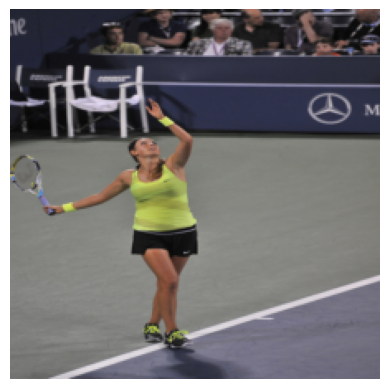

Question: [CLS] is there a woman in the crowd wearing a see threw shirt? [SEP]
Prediction: yes
Ground Truth Label: no


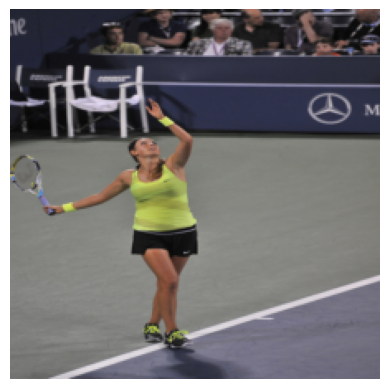

Question: [CLS] what color is her tank top? [SEP]
Prediction: yes
Ground Truth Label: yellow


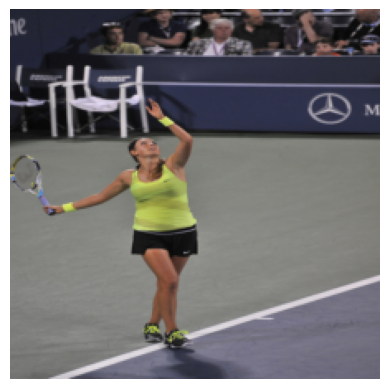

Question: [CLS] what car is being advertised? [SEP]
Prediction: yes
Ground Truth Label: mercedes


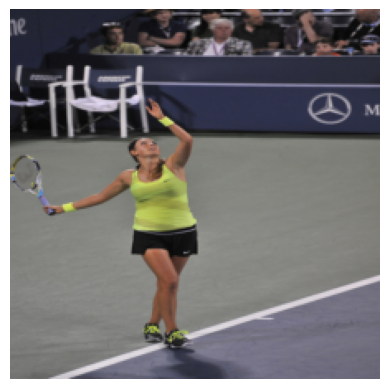

Question: [CLS] why does the player have yellow wristbands? [SEP]
Prediction: yes
Ground Truth Label: sweat


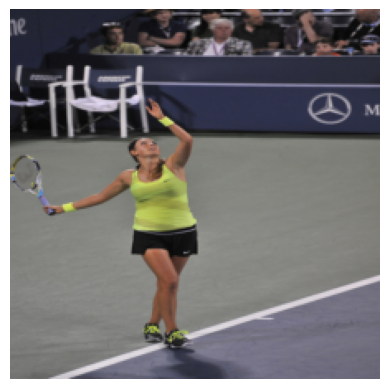

Question: [CLS] what auto dealer is advertised? [SEP]
Prediction: yes
Ground Truth Label: mercedes


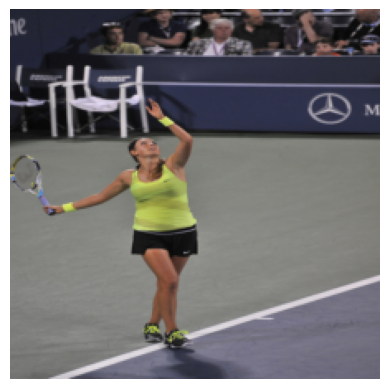

Question: [CLS] what kind of business is being advertised on the wall? [SEP]
Prediction: yes
Ground Truth Label: mercedes


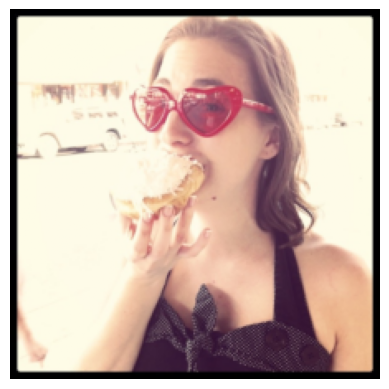

Question: [CLS] what does the woman have on her eyes? [SEP]
Prediction: yes
Ground Truth Label: sunglasses


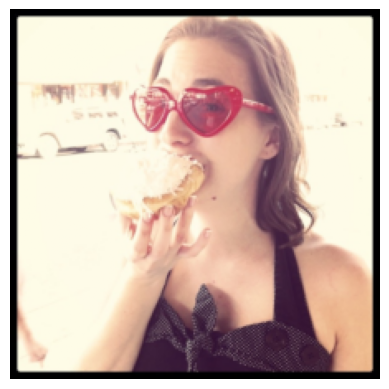

Question: [CLS] what are they eating? [SEP]
Prediction: yes
Ground Truth Label: [UNK]


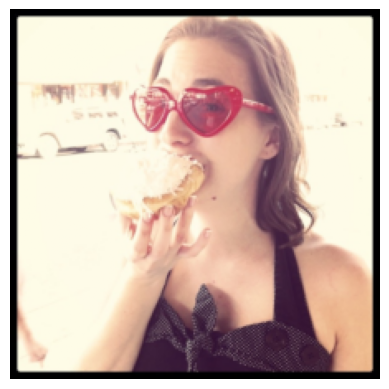

Question: [CLS] is the woman wearing any rings? [SEP]
Prediction: yes
Ground Truth Label: no


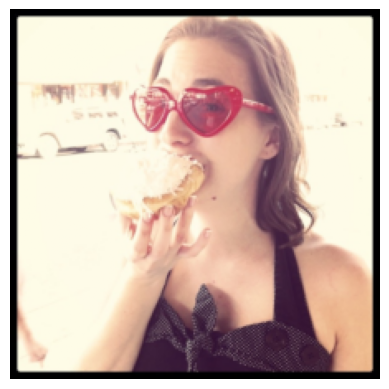

Question: [CLS] is she holding a phone? [SEP]
Prediction: yes
Ground Truth Label: no


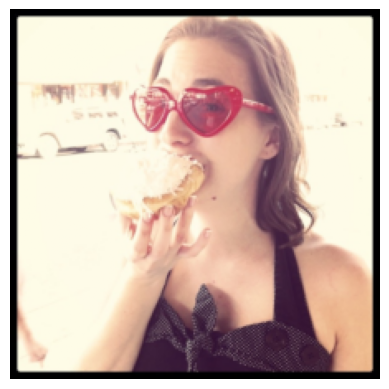

Question: [CLS] what is the girl going to eat? [SEP]
Prediction: yes
Ground Truth Label: [UNK]


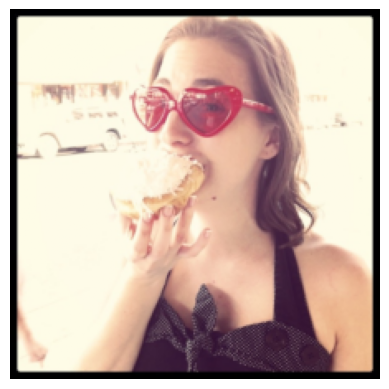

Question: [CLS] is this person wearing jewelry? [SEP]
Prediction: yes
Ground Truth Label: no


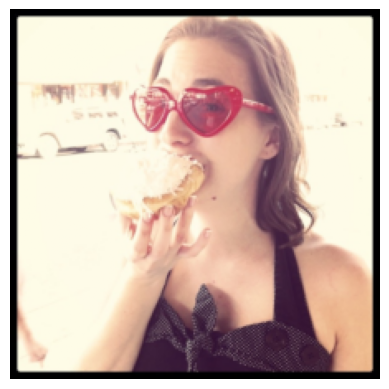

Question: [CLS] what color is the woman's hair? [SEP]
Prediction: yes
Ground Truth Label: brown


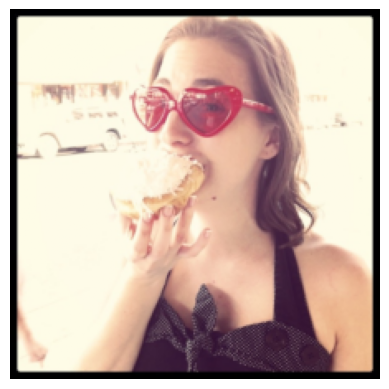

Question: [CLS] is the woman wearing earrings? [SEP]
Prediction: yes
Ground Truth Label: no


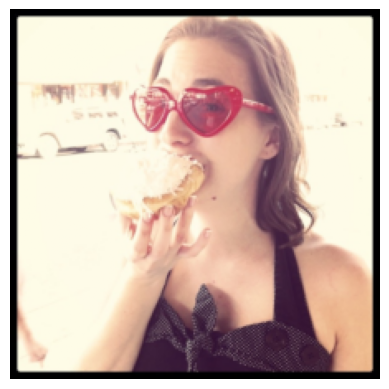

Question: [CLS] what is she eating? [SEP]
Prediction: yes
Ground Truth Label: [UNK]


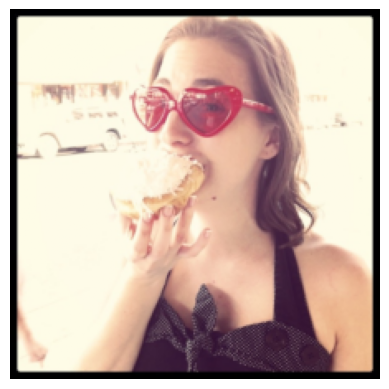

Question: [CLS] what is the woman eating? [SEP]
Prediction: yes
Ground Truth Label: [UNK]


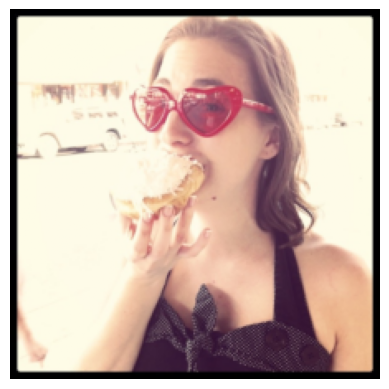

Question: [CLS] what shape are her sunglasses? [SEP]
Prediction: yes
Ground Truth Label: heart


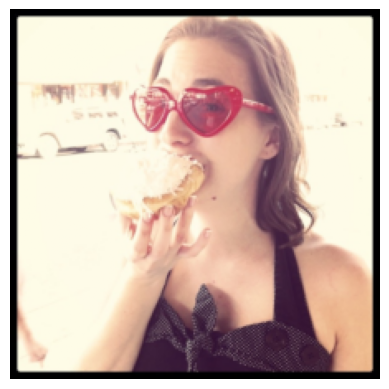

Question: [CLS] what is she holding with her right hand? [SEP]
Prediction: yes
Ground Truth Label: [UNK]


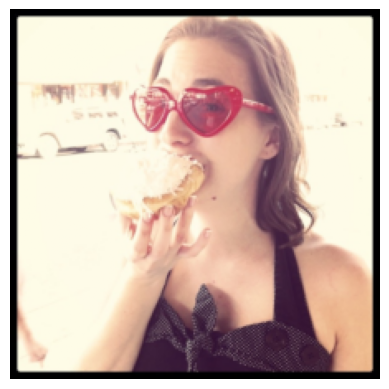

Question: [CLS] what kind of doughnut is that? [SEP]
Prediction: yes
Ground Truth Label: [UNK]


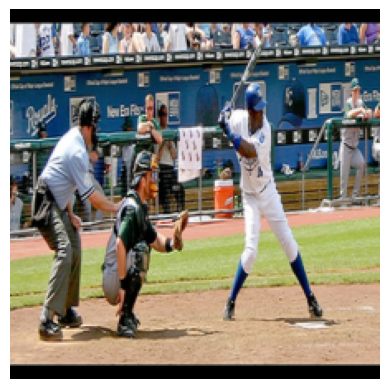

Question: [CLS] which game is being played? [SEP]
Prediction: yes
Ground Truth Label: baseball


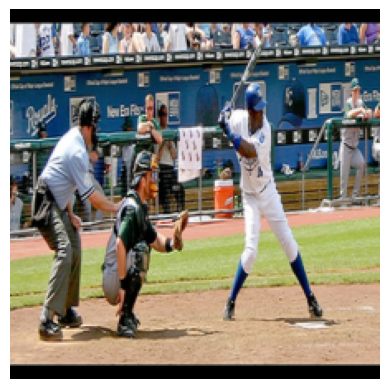

Question: [CLS] are the players adults? [SEP]
Prediction: yes
Ground Truth Label: yes


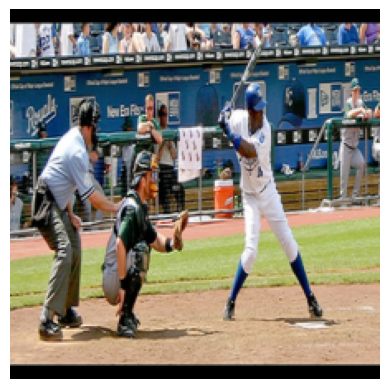

Question: [CLS] what color jersey is the batter wearing? [SEP]
Prediction: yes
Ground Truth Label: white


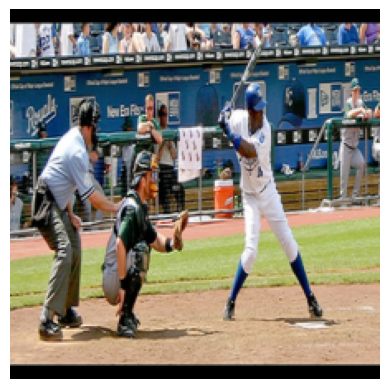

Question: [CLS] did the batter swing at the ball? [SEP]
Prediction: yes
Ground Truth Label: no


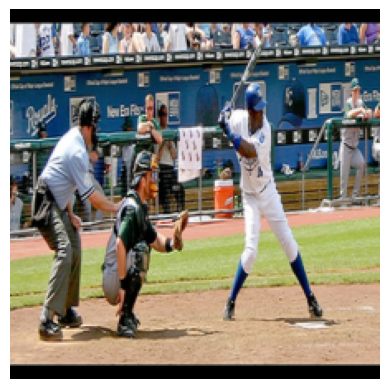

Question: [CLS] what drink is being advertised in this picture? [SEP]
Prediction: yes
Ground Truth Label: [UNK]


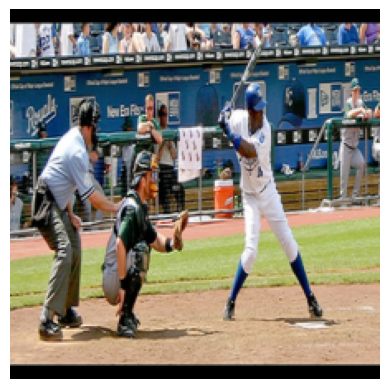

Question: [CLS] what side is the battery on? [SEP]
Prediction: yes
Ground Truth Label: right


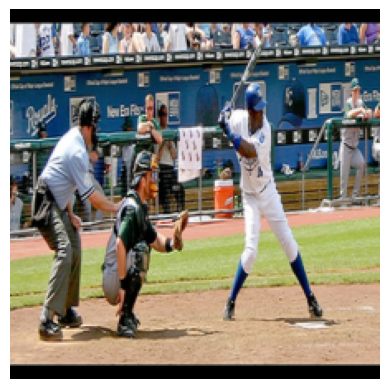

Question: [CLS] how many coolers in the picture? [SEP]
Prediction: yes
Ground Truth Label: 1


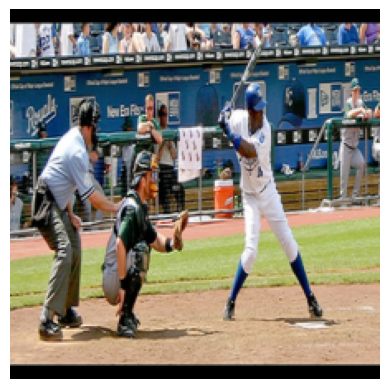

Question: [CLS] what is in the batter's hand? [SEP]
Prediction: yes
Ground Truth Label: bat


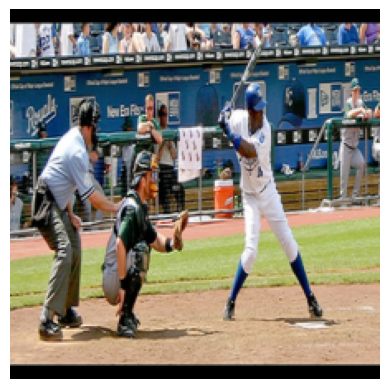

Question: [CLS] who is behind the catcher? [SEP]
Prediction: yes
Ground Truth Label: umpire


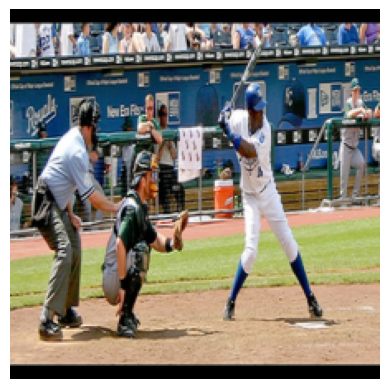

Question: [CLS] are both the batter's feet on the ground? [SEP]
Prediction: yes
Ground Truth Label: yes


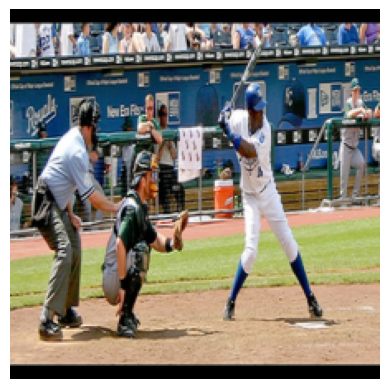

Question: [CLS] what do we call the man wearing black? [SEP]
Prediction: yes
Ground Truth Label: catcher


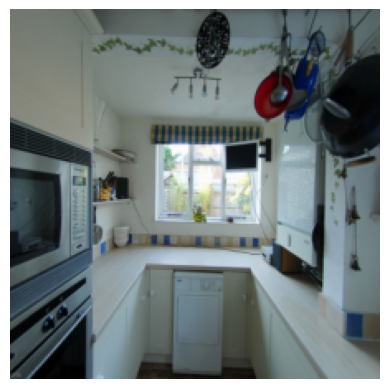

Question: [CLS] is it daytime? [SEP]
Prediction: yes
Ground Truth Label: yes


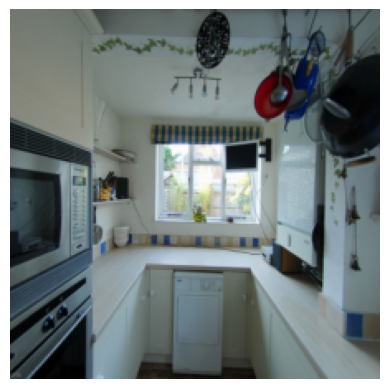

Question: [CLS] which room is this? [SEP]
Prediction: yes
Ground Truth Label: kitchen


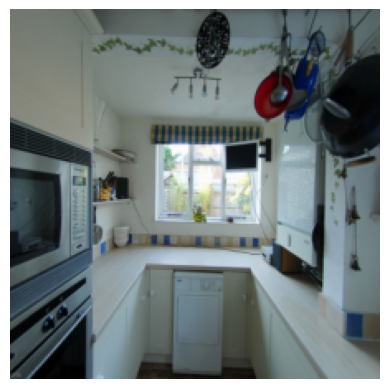

Question: [CLS] what color are the walls? [SEP]
Prediction: yes
Ground Truth Label: white


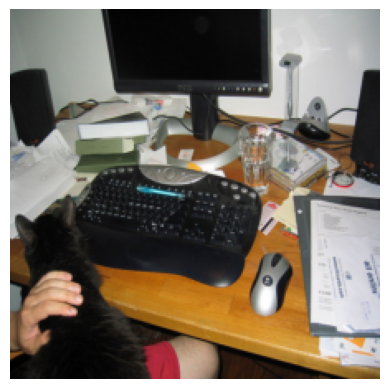

Question: [CLS] what is on the person's lap? [SEP]
Prediction: yes
Ground Truth Label: cat


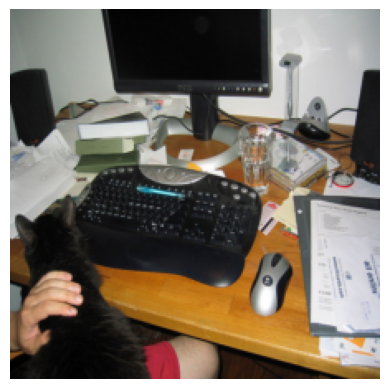

Question: [CLS] is the monitor turned on? [SEP]
Prediction: yes
Ground Truth Label: no


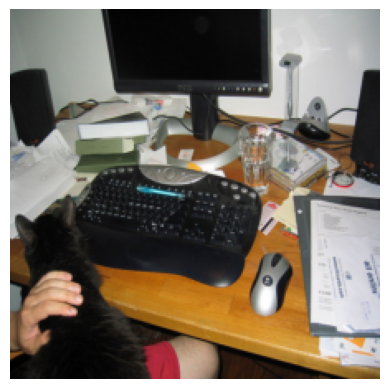

Question: [CLS] where did the person working on the computer probably go? [SEP]
Prediction: yes
Ground Truth Label: nowhere


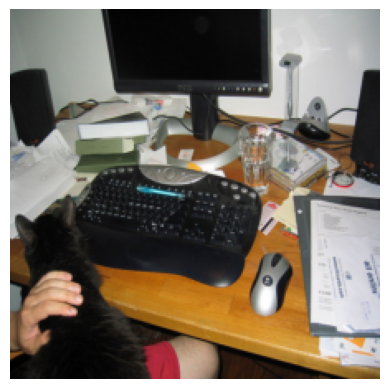

Question: [CLS] what color is the cat? [SEP]
Prediction: yes
Ground Truth Label: black


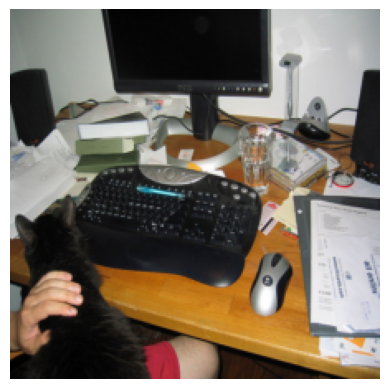

Question: [CLS] is the monitor on? [SEP]
Prediction: yes
Ground Truth Label: no


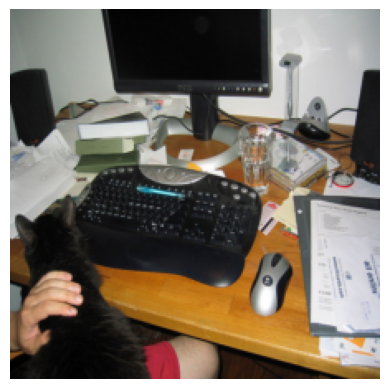

Question: [CLS] what type of paper is shown? [SEP]
Prediction: yes
Ground Truth Label: [UNK]


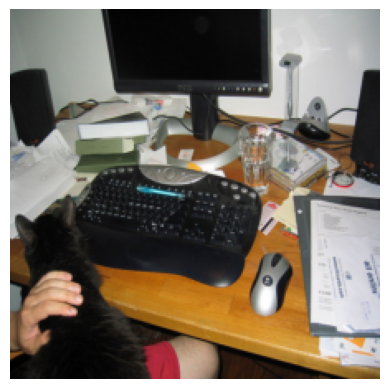

Question: [CLS] what is to the right of the keyboard? [SEP]
Prediction: yes
Ground Truth Label: mouse


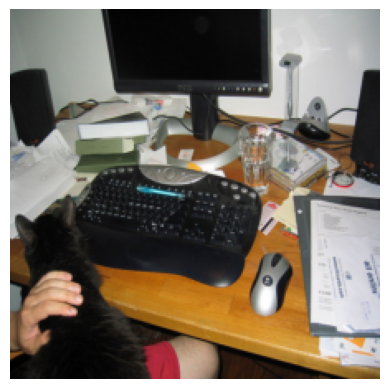

Question: [CLS] what is in the cup? [SEP]
Prediction: yes
Ground Truth Label: water


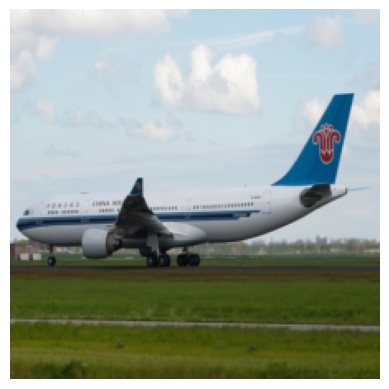

Question: [CLS] how many engines on the plane? [SEP]
Prediction: no
Ground Truth Label: 2


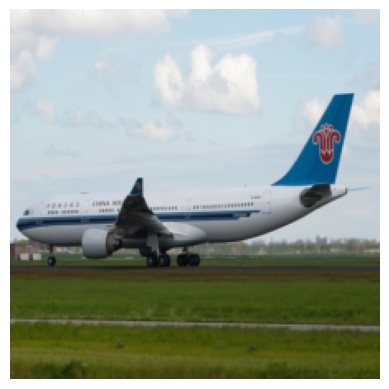

Question: [CLS] do you think the plane just landed? [SEP]
Prediction: no
Ground Truth Label: yes


In [37]:
import torch
import torch.nn as nn
from transformers import BertModel, ViTModel, BertTokenizer
from torch.utils.data import DataLoader
from tqdm import tqdm
from torchvision import transforms
import numpy as np
import matplotlib.pyplot as plt
from torch.nn.utils.rnn import pad_sequence
    
def decode_predictions(output, tokenizer):
    probabilities = torch.softmax(output, dim=-1)
    predicted_index = torch.argmax(probabilities, dim=-1).item()
    tokens = tokenizer.convert_ids_to_tokens(predicted_index)
    prediction = "".join(tokens)
    return prediction

def compute_accuracy(predictions, label):
    correct = 1 if predictions == label else 0
    return correct

class VQAModel(nn.Module):
    def __init__(self, image_model, text_model, vocab_size):
        super(VQAModel, self).__init__()
        self.image_model = image_model
        self.text_model = text_model
        self.hidden_size = 768  # assuming the hidden size of ViT and BERT
        self.image_projection = nn.Linear(in_features=self.hidden_size, out_features=self.hidden_size)
        self.attention_text = nn.Linear(self.hidden_size, 1)
        self.attention_image = nn.Linear(self.hidden_size, 1)
        self.decoder = nn.Linear(in_features=self.hidden_size, out_features=vocab_size)

    def forward(self, image_features, input_ids, attention_mask):
        # Text features
        text_output = self.text_model(input_ids=input_ids, attention_mask=attention_mask).last_hidden_state[:, 0, :]

        # Image features projection
        projected_image_features = self.image_projection(image_features)

        # Calculate attention weights
        att_text = torch.sigmoid(self.attention_text(text_output))
        att_image = torch.sigmoid(self.attention_image(projected_image_features))

        # Weighted sum of text and image features
        combined_output = att_text * text_output + att_image * projected_image_features

        # Decoder
        logits = self.decoder(combined_output)
        return logits

# Instantiate model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = VQAModel(vit_model, text_model, vocab_size=tokenizer.vocab_size).to(device)
model.load_state_dict(torch.load("/kaggle/input/vqamodel/vqa_model.pth", map_location=device))
model.eval()

def show_image(image):
    # Convert tensor to numpy array
    image = image.cpu().numpy().transpose(1, 2, 0)
    
#     # Denormalize
#     mean = np.array([0.485, 0.456, 0.406])
#     std = np.array([0.229, 0.224, 0.225])
#     image = std * image + mean
#     image = np.clip(image, 0, 1)

    # Show the image
    plt.imshow(image)
    plt.axis('off')
    plt.show()
    
    
# Iterate through the test dataset
with torch.no_grad():
    for batch in test_loader:
        input_ids = batch["input_ids"].to(device)
        attention_mask = batch["attention_mask"].to(device)
        original_image = batch["original_image"]
        image = batch["image_features"].to(device)
        labels = batch["label"]

        # Forward pass
        outputs = model(image, input_ids, attention_mask)

        # Decode prediction and ground truth label
        prediction = decode_predictions(outputs, tokenizer)
        label = tokenizer.convert_ids_to_tokens(labels.item())

        # Compute accuracy
        accuracy = compute_accuracy(prediction, label)

        # Show the image
        show_image(original_image[0].squeeze())
        question = tokenizer.decode(input_ids.squeeze().tolist())
        print("Question:",question)
        print("Prediction:",prediction)
        print("Ground Truth Label:",label)


